In [1]:
import torch
from transformers import CLIPProcessor, CLIPModel
import glob
from PIL import Image
from umap.umap_ import UMAP
import hdbscan
from hdbscan import HDBSCAN
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances

In [2]:
model_name = "laion/CLIP-ViT-L-14-DataComp.XL-s13B-b90K"
model = CLIPModel.from_pretrained(model_name)

In [3]:
device = "cpu"
model.to(device)

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elem

In [4]:
processor = CLIPProcessor.from_pretrained(model_name)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [5]:
def get_image_embedding(image_path: str):
    image = Image.open(image_path).convert("RGB")  
    with torch.no_grad():
        inputs = processor(images=image, return_tensors="pt", padding=True)
        inputs = {k: v.to(device) for k, v in inputs.items()}
        return model.get_image_features(**inputs)

image_paths = sorted(glob.glob("./images/*"))
image_embeddings = torch.cat([get_image_embedding(path) for path in image_paths])

In [6]:
csv = "powerpoint_data.csv"
df_text = pd.read_csv(csv)

all_texts = []

for _, row in df_text.iterrows():
    all_texts.append(row.get('fixed body', ''))
    all_texts.append(row.get('waiting body', ''))
    all_texts.append(row.get('not fixed body', ''))

In [7]:
from tqdm import tqdm

def get_text_embedding(text: str) -> torch.Tensor:
    with torch.no_grad():
        inputs = processor(text=[text],       
                           return_tensors="pt",
                           padding=True,
                           truncation=True)
        inputs = {k: v.to(device) for k, v in inputs.items()}
        return model.get_text_features(**inputs)
    
text_embeddings = torch.cat(
    [get_text_embedding(t) for t in tqdm(all_texts)],
    dim=0
)

100%|██████████| 270/270 [00:09<00:00, 28.89it/s]


In [8]:
image_embeddings.shape

torch.Size([270, 768])

In [9]:
all_texts[0]

'Da min farfar døde, arvede jeg hans teaktræsmoduler til at bygge en sofa samt lænestol. Følgende havde været brugt i mange år, og flere dele var derfor ødelagte. For at sætte sofaen i stand, sleb jeg træet og gav det nyt olie. Herudover købte jeg koldskum til nye hynder, som min mor hjalp mig med at sy betræk til. Desuden blev der også sat nye gjorde i bunden, da flere af de gamle sad løst eller var knækket.\u200b'

In [10]:
image_paths[0]

'./images\\group01_0_Josephine_1.jpg'

In [11]:
text_embeddings.shape

torch.Size([270, 768])

In [12]:
#umap_model = UMAP(n_components=10)
#reduced_embeddings = umap_model.fit_transform(image_embeddings.cpu().numpy())
#print(reduced_embeddings.shape)

In [38]:
normalized_embeddings = normalize(image_embeddings, norm="l2")
#dist_matrix = cosine_distances(normalized_embeddings)

In [27]:
clusterer = HDBSCAN(
    min_cluster_size=5,
    min_samples=3
    #metric='precomputed' did not change the clusters
)
cluster_labels = clusterer.fit_predict(normalized_embeddings)

C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


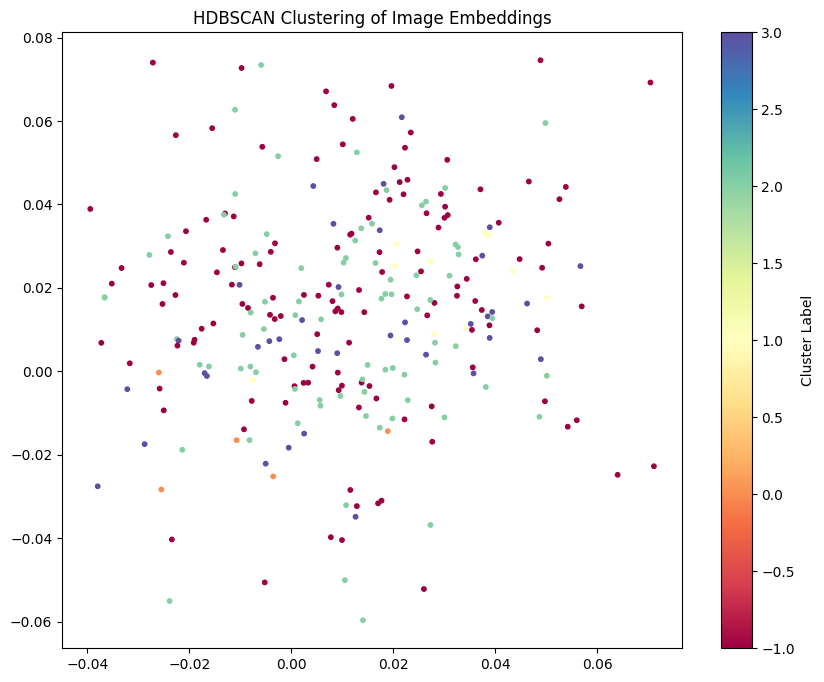

In [28]:
plt.figure(figsize=(10, 8))
plt.scatter(
    normalized_embeddings[:, 0],
    normalized_embeddings[:, 1],
    c=cluster_labels,
    cmap='Spectral',
    s=10
)
plt.colorbar(label='Cluster Label')
plt.title('HDBSCAN Clustering of Image Embeddings')
plt.show()


In [29]:
df = pd.DataFrame({
    "image": image_paths,
    "cluster": cluster_labels
})

print(df["cluster"].value_counts())

cluster
-1    137
 2     81
 3     37
 1     10
 0      5
Name: count, dtype: int64


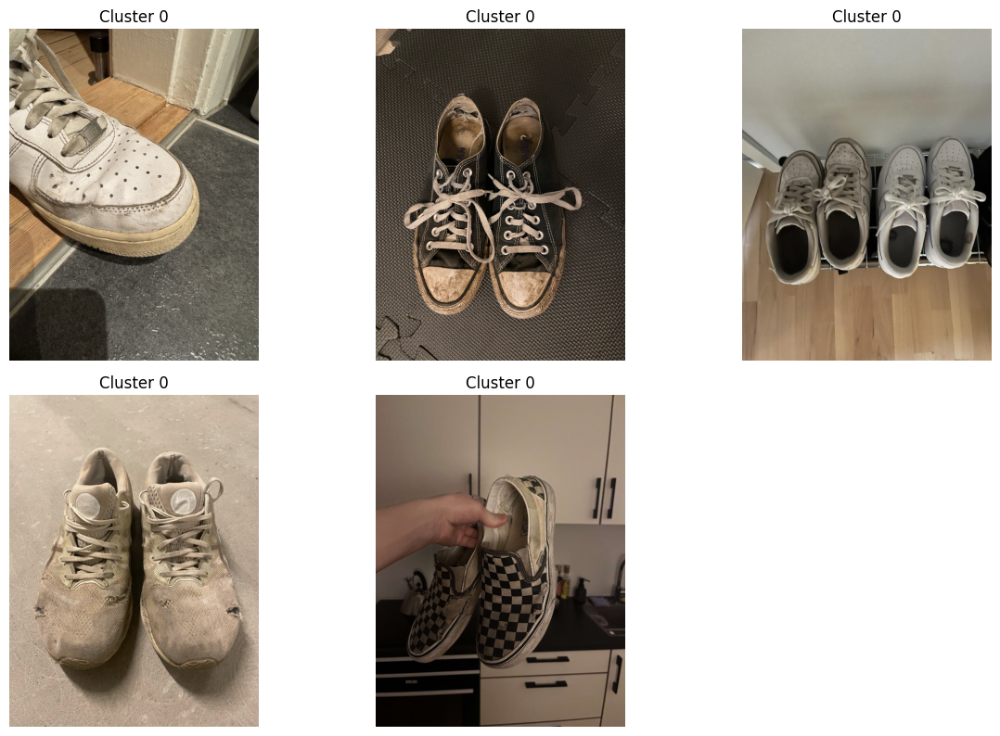

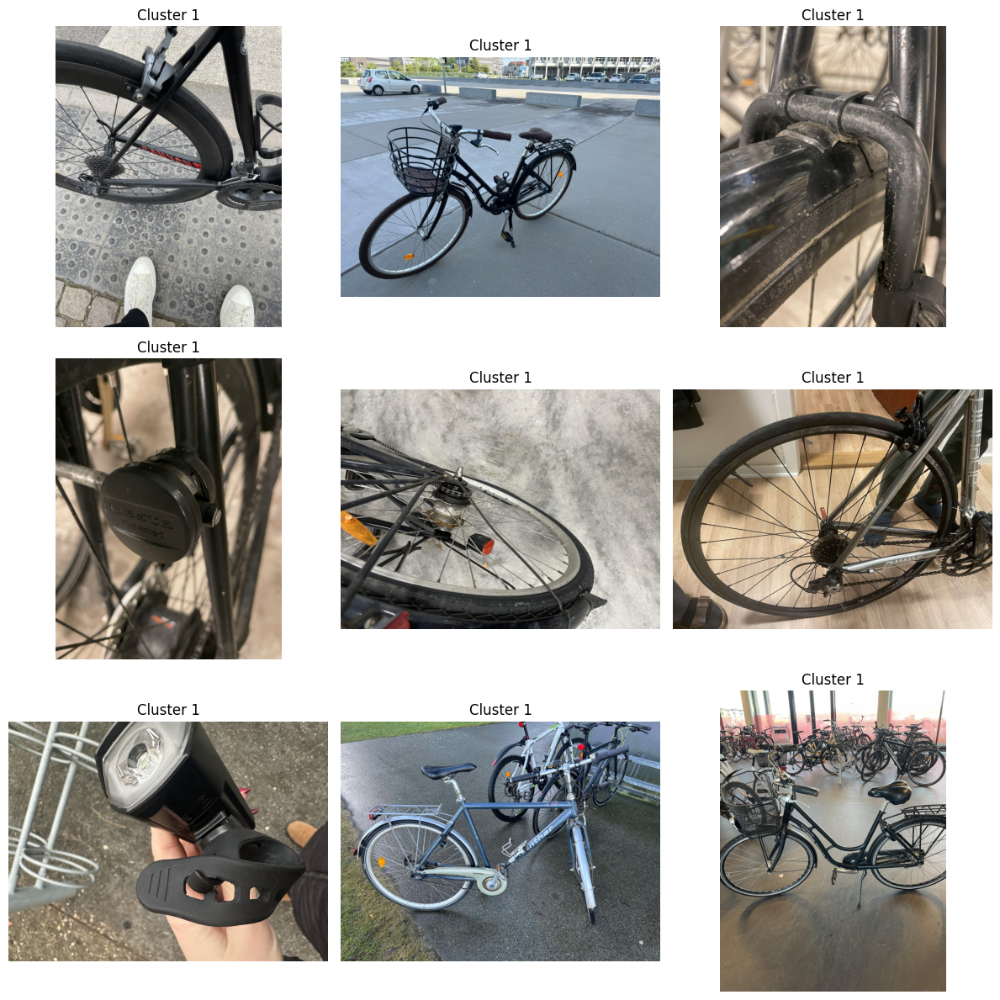

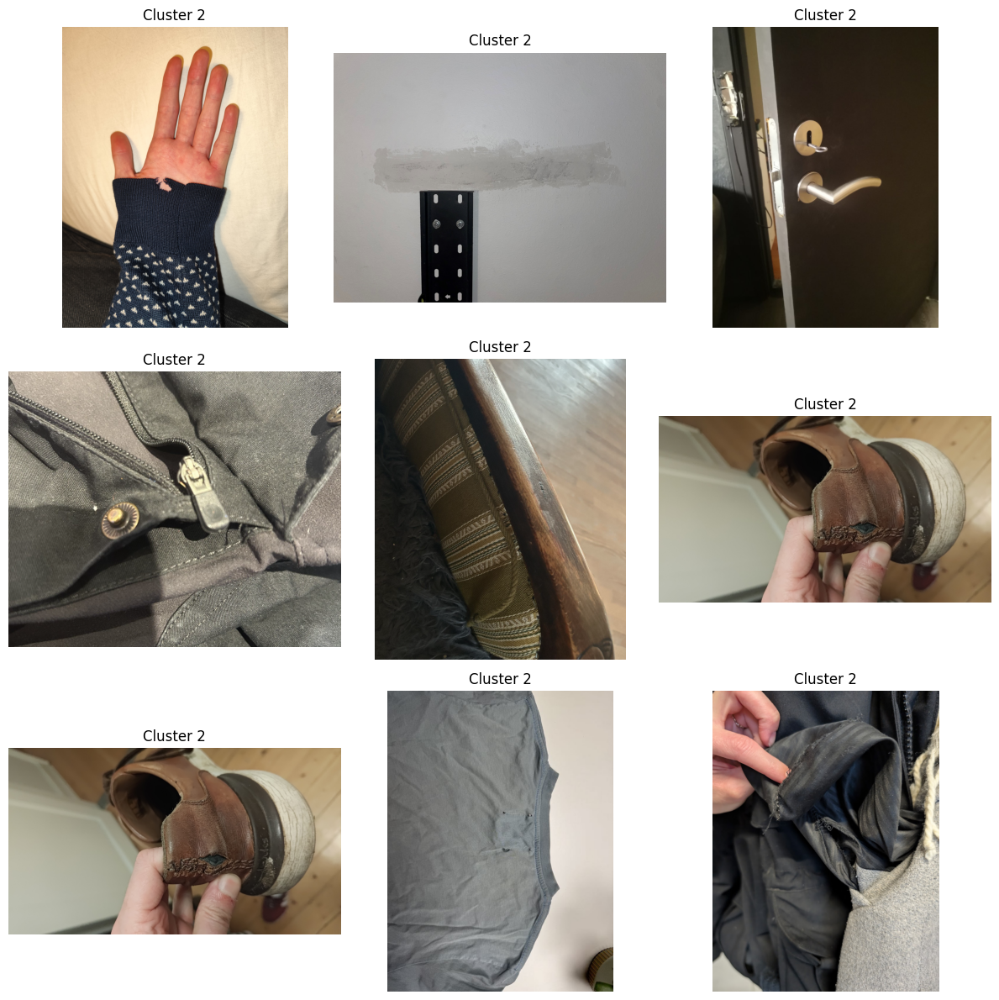

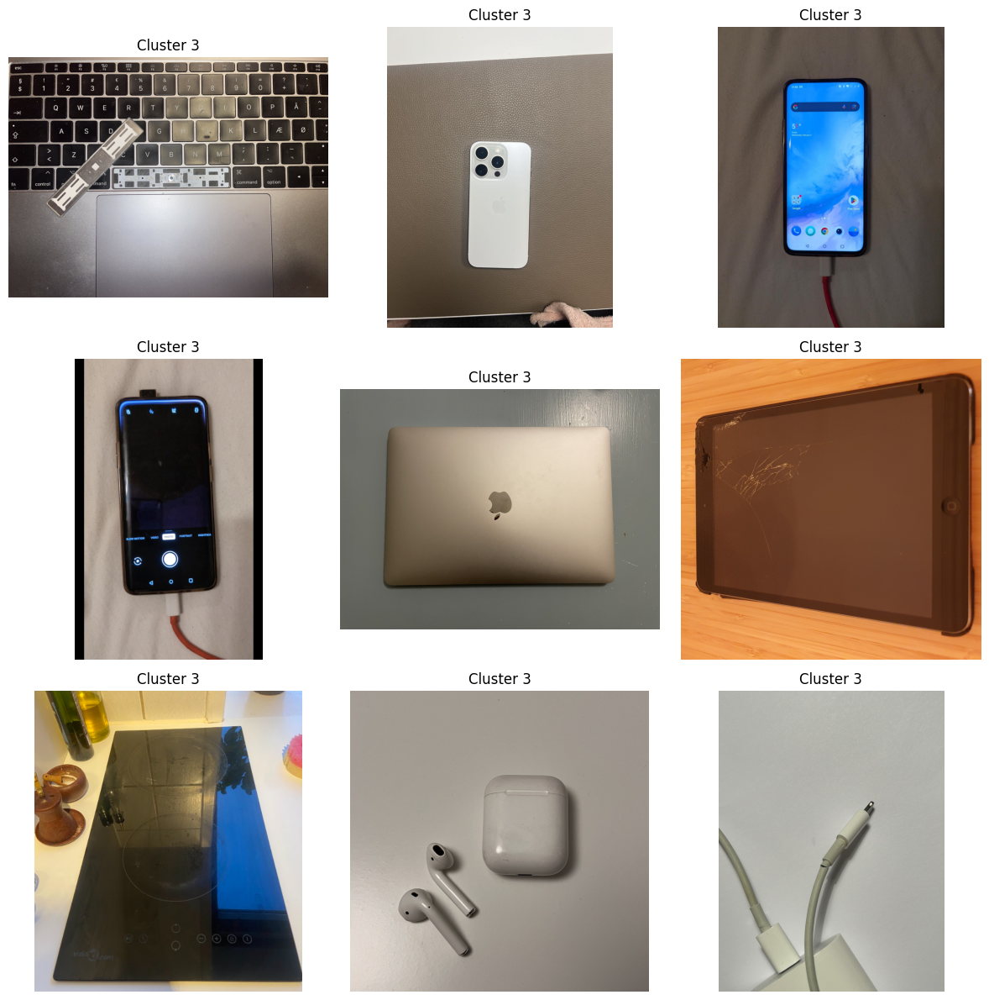

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

In [30]:
def show_cluster_images(cluster_number, n=9):
    paths = [path for path, label in zip(image_paths, cluster_labels) if label == cluster_number]
    sample_paths = paths[:n]

    plt.figure(figsize=(12, 12))
    for i, img_path in enumerate(sample_paths):
        plt.subplot(3, 3, i+1)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.title(f"Cluster {cluster_number}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

show_cluster_images(0)
show_cluster_images(1)
show_cluster_images(2)
show_cluster_images(3)
show_cluster_images(4)
show_cluster_images(5)
show_cluster_images(6)
show_cluster_images(7)

In [31]:
num_clusters = df["cluster"].nunique() - (1 if -1 in df["cluster"].values else 0)
print(f"Number of clusters: {num_clusters}")

Number of clusters: 4


In [87]:
normalized_embeddings1 = normalize(text_embeddings, norm='l2')

In [88]:
cluster_labels1 = clusterer.fit_predict(normalized_embeddings1)

C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


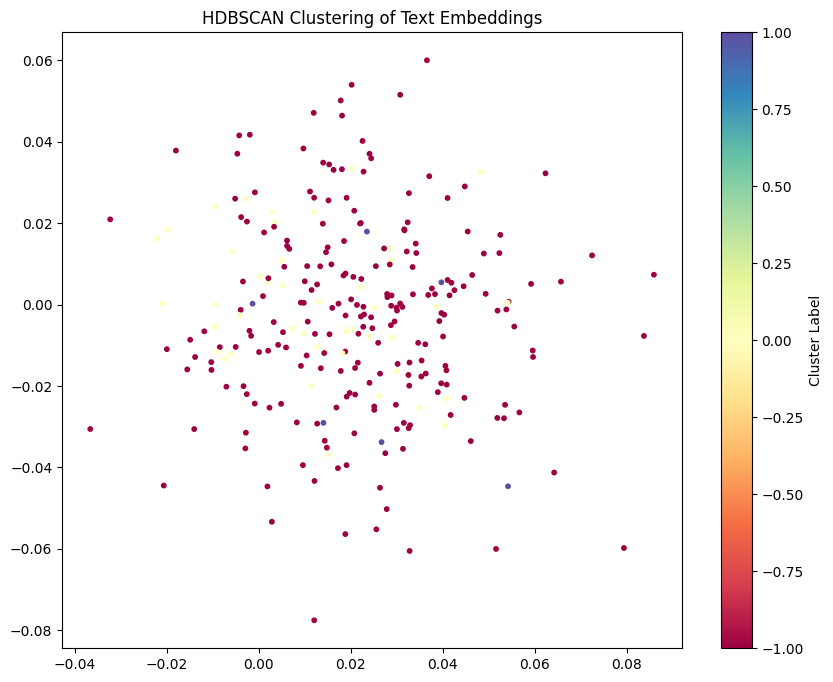

In [93]:
plt.figure(figsize=(10, 8))
plt.scatter(
    normalized_embeddings1[:, 0],
    normalized_embeddings1[:, 1],
    c=cluster_labels1,
    cmap='Spectral',
    s=10
)
plt.colorbar(label='Cluster Label')
plt.title('HDBSCAN Clustering of Text Embeddings')
plt.show()


In [102]:
# ARI and NMI between image and text clusters
ari = adjusted_rand_score(cluster_labels, cluster_labels1)
nmi = normalized_mutual_info_score(cluster_labels, cluster_labels1)
print(ari)
print(nmi)

0.05708952152344381
0.09163528217316709


In [78]:
image_np = image_embeddings.cpu().numpy()
text_np = text_embeddings.cpu().numpy()

combined_embeddings = (image_np + text_np) / 2

In [79]:
#umap_model = UMAP(n_components=10)
#reduced_embeddings = umap_model.fit_transform(combined_embeddings)
#print(reduced_embeddings.shape)

(270, 10)


C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [80]:
normalized_embeddings2 = normalize(combined_embeddings, norm='l2')

In [85]:
cluster_labels2 = clusterer.fit_predict(normalized_embeddings2)

C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


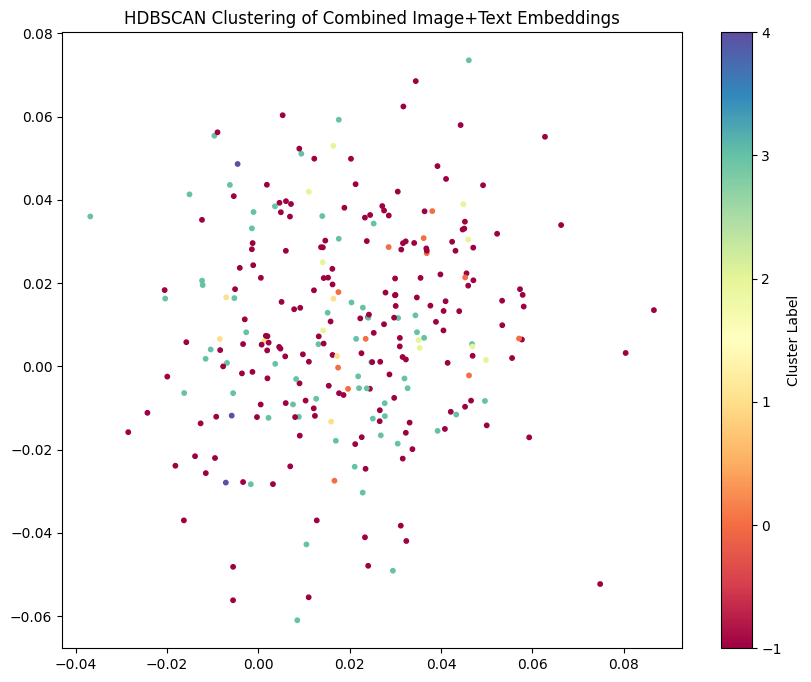

In [86]:
plt.figure(figsize=(10, 8))
plt.scatter(
    normalized_embeddings2[:, 0], normalized_embeddings2[:, 1],
    c=cluster_labels2,
    cmap='Spectral',
    s=10
)
plt.colorbar(label='Cluster Label')
plt.title('HDBSCAN Clustering of Combined Image+Text Embeddings')
plt.show()

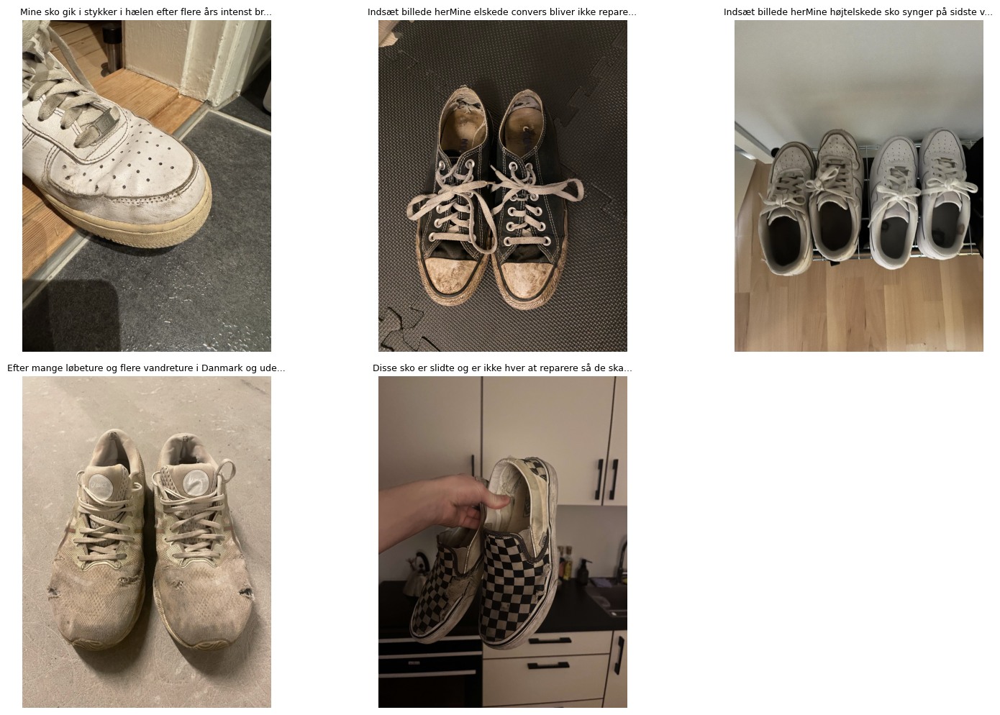

C:\Users\Sandra\AppData\Local\Temp\ipykernel_12104\2352129339.py:14: UserWarning: Glyph 9 (	) missing from current font.
  plt.tight_layout()
C:\Users\Sandra\Desktop\Work\Design\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


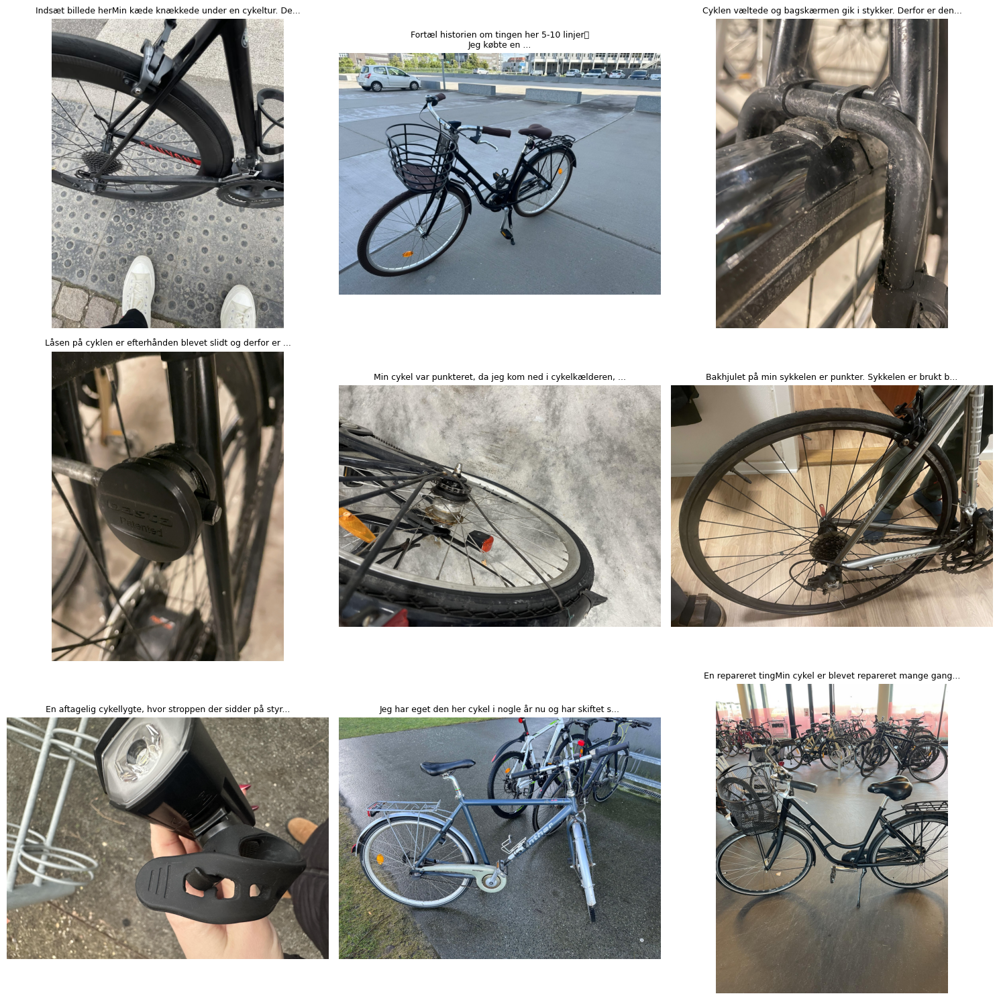

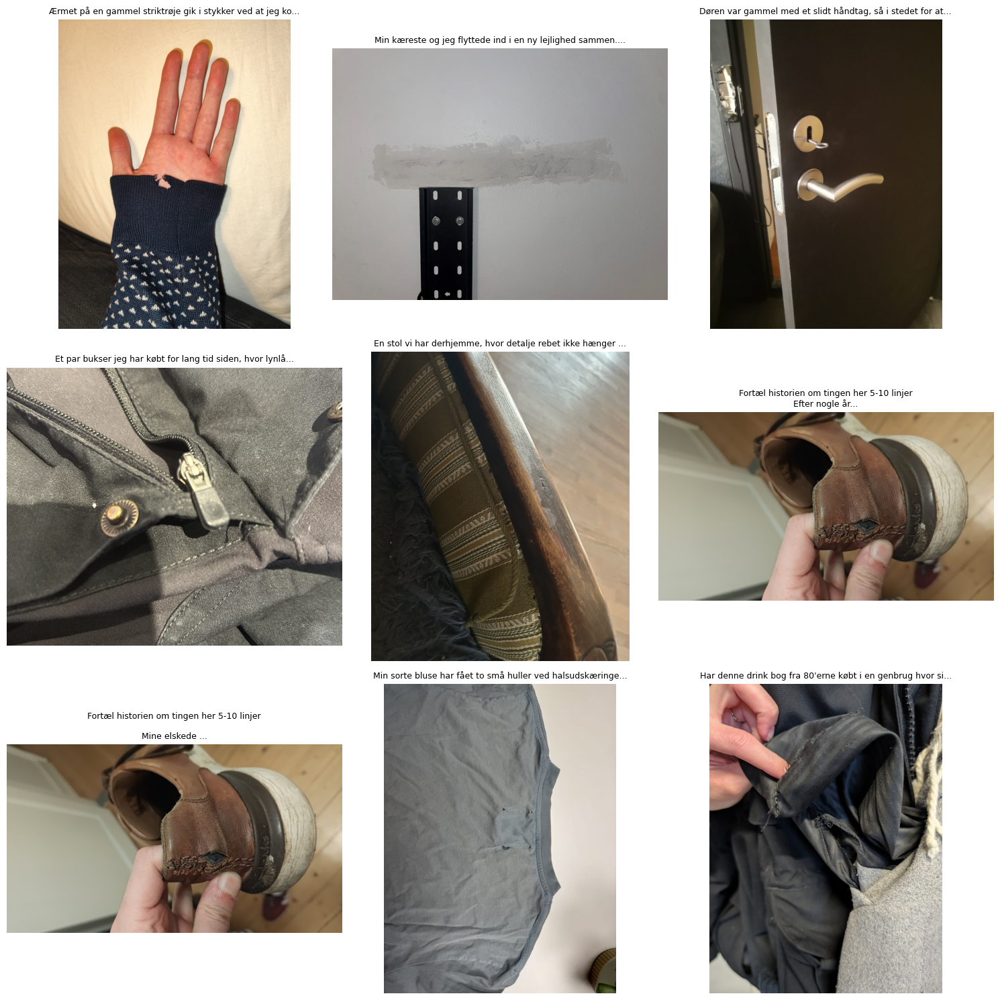

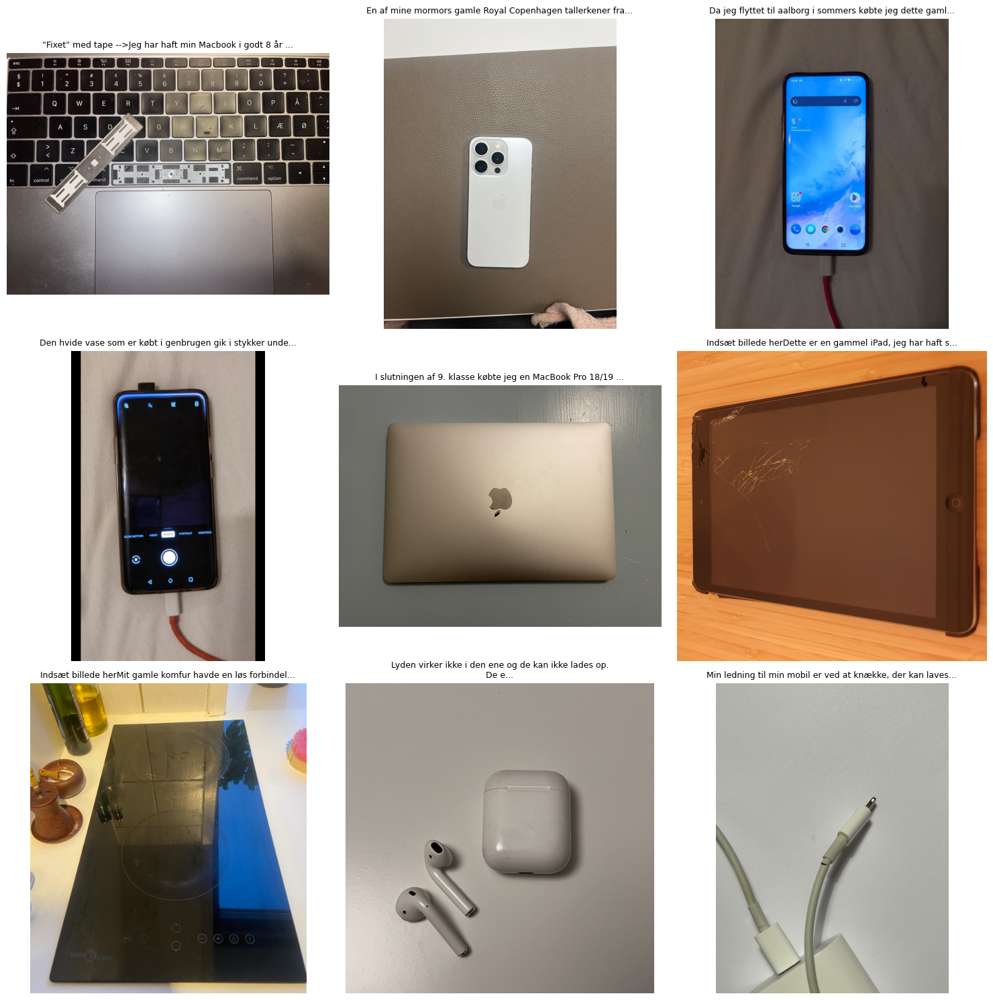

<Figure size 1500x1500 with 0 Axes>

<Figure size 1500x1500 with 0 Axes>

<Figure size 1500x1500 with 0 Axes>

<Figure size 1500x1500 with 0 Axes>

In [83]:
def show_cluster_images_with_text(cluster_number, n=9):
    filtered = [(path, txt) for path, txt, label in zip(image_paths, all_texts, cluster_labels) if label == cluster_number]
    sample = filtered[:n]

    plt.figure(figsize=(15, 15))
    for i, (img_path, txt) in enumerate(sample):
        plt.subplot(3, 3, i + 1)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        display_text = txt if len(txt) < 60 else txt[:57] + "..."
        plt.title(display_text, fontsize=9)

    plt.tight_layout()
    plt.show()

for cnum in range(8):
    show_cluster_images_with_text(cnum)

In [84]:
ari = adjusted_rand_score(cluster_labels, cluster_labels2)
nmi = normalized_mutual_info_score(cluster_labels, cluster_labels2)
print(ari)
print(nmi)

0.45597443874539734
0.48318363201807
